# Data Ingestion and initial EDA

In [2]:
import pandas as pd
import numpy as np

**Type of Problem:** Classification of Drought Conditions in U.S. Counties based on meteorological and soil data

In [13]:
# Ingest meteorological data from training dataset as dataframe
train = pd.read_csv(r'C:\Users\iamwe\Documents\03.Work\Coding\Lambda School\Data Science\02.Unit 2\05.Portfolio Project\Drought Weather Soil\train_timeseries\train_timeseries.csv')
train.head()

,fips,date,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,...,TS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,score
0,1001,2000-01-01,0.22,100.51,9.65,14.74,13.51,13.51,20.96,11.46,...,14.65,2.20,2.94,1.49,1.46,4.85,6.04,3.23,2.81,NaN
1,1001,2000-01-02,0.20,100.55,10.42,16.69,14.71,14.71,22.80,12.61,...,16.60,2.52,3.43,1.83,1.60,5.33,6.13,3.72,2.41,NaN
2,1001,2000-01-03,3.65,100.15,11.76,18.49,16.52,16.52,22.73,15.32,...,18.41,4.03,5.33,2.66,2.67,7.53,9.52,5.87,3.66,NaN
3,1001,2000-01-04,15.95,100.29,6.42,11.40,6.09,6.10,18.09,2.16,...,11.31,3.84,5.67,2.08,3.59,6.73,9.31,3.74,5.58,1.0
4,1001,2000-01-05,0.00,101.15,2.95,3.86,-3.29,-3.20,10.82,-2.66,...,2.65,1.60,2.50,0.52,1.98,2.94,4.85,0.65,4.19,NaN


In [4]:
train.shape

(19300680, 21)

In [ ]:
# Determine whether there are NaNs in the data and their significance (if any)
train.isna().sum()

In [6]:
train.describe() # Explore the training dataset

,fips,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,T2M_RANGE,TS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,score
count,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,1.930068e+07,2.756796e+06
mean,3.067038e+04,2.644145e+00,9.665578e+01,7.816178e+00,1.280146e+01,6.951072e+00,6.986916e+00,1.868141e+01,7.411665e+00,1.126974e+01,1.288900e+01,3.564013e+00,5.195993e+00,1.928879e+00,3.267113e+00,5.525151e+00,7.811798e+00,3.130077e+00,4.681721e+00,8.245298e-01
std,1.497911e+04,6.226305e+00,5.447994e+00,4.694305e+00,1.092674e+01,1.014551e+01,1.009116e+01,1.154487e+01,1.057680e+01,4.005165e+00,1.114961e+01,1.862297e+00,2.627969e+00,1.351713e+00,1.947028e+00,2.321549e+00,2.861210e+00,2.122751e+00,2.171263e+00,1.223727e+00
min,1.001000e+03,0.000000e+00,6.612000e+01,1.200000e-01,-3.734000e+01,-3.770000e+01,-3.746000e+01,-3.220000e+01,-4.596000e+01,3.000000e-02,-3.823000e+01,2.500000e-01,5.400000e-01,0.000000e+00,1.600000e-01,4.000000e-01,7.000000e-01,0.000000e+00,3.200000e-01,0.000000e+00
25%,1.904450e+04,0.000000e+00,9.584000e+01,3.780000e+00,4.450000e+00,-9.600000e-01,-9.200000e-01,1.027000e+01,-7.000000e-01,8.420000e+00,4.340000e+00,2.140000e+00,3.110000e+00,9.600000e-01,1.810000e+00,3.790000e+00,5.680000e+00,1.450000e+00,3.130000e+00,0.000000e+00
50%,2.921200e+04,1.800000e-01,9.830000e+01,6.840000e+00,1.402000e+01,7.570000e+00,7.580000e+00,2.040000e+01,8.030000e+00,1.124000e+01,1.404000e+01,3.140000e+00,4.670000e+00,1.660000e+00,2.800000e+00,5.120000e+00,7.310000e+00,2.770000e+00,4.250000e+00,0.000000e+00
75%,4.600750e+04,2.160000e+00,9.996000e+01,1.135000e+01,2.188000e+01,1.552000e+01,1.552000e+01,2.787000e+01,1.614000e+01,1.408000e+01,2.207000e+01,4.600000e+00,6.750000e+00,2.580000e+00,4.250000e+00,6.880000e+00,9.460000e+00,4.410000e+00,5.770000e+00,1.189600e+00
max,5.604300e+04,2.345900e+02,1.043200e+02,2.292000e+01,4.139000e+01,2.755000e+01,2.755000e+01,4.991000e+01,3.380000e+01,3.461000e+01,4.385000e+01,2.369000e+01,3.628000e+01,1.720000e+01,2.825000e+01,2.835000e+01,4.273000e+01,2.087000e+01,3.243000e+01,5.000000e+00


In [6]:
train.head(20)

,fips,date,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,...,TS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,score
0,1001,2000-01-01,0.22,100.51,9.65,14.74,13.51,13.51,20.96,11.46,...,14.65,2.20,2.94,1.49,1.46,4.85,6.04,3.23,2.81,NaN
1,1001,2000-01-02,0.20,100.55,10.42,16.69,14.71,14.71,22.80,12.61,...,16.60,2.52,3.43,1.83,1.60,5.33,6.13,3.72,2.41,NaN
2,1001,2000-01-03,3.65,100.15,11.76,18.49,16.52,16.52,22.73,15.32,...,18.41,4.03,5.33,2.66,2.67,7.53,9.52,5.87,3.66,NaN
3,1001,2000-01-04,15.95,100.29,6.42,11.40,6.09,6.10,18.09,2.16,...,11.31,3.84,5.67,2.08,3.59,6.73,9.31,3.74,5.58,1.0
4,1001,2000-01-05,0.00,101.15,2.95,3.86,-3.29,-3.20,10.82,-2.66,...,2.65,1.60,2.50,0.52,1.98,2.94,4.85,0.65,4.19,NaN
5,1001,2000-01-06,0.01,101.31,3.49,4.99,-1.11,-1.07,12.89,-2.96,...,3.32,1.55,2.39,0.04,2.35,2.95,5.22,0.05,5.17,NaN
6,1001,2000-01-07,0.01,101.37,3.93,5.99,0.55,0.58,14.51,0.63,...,5.69,2.31,3.28,1.59,1.69,5.02,6.47,2.44,4.03,NaN
7,1001,2000-01-08,1.02,100.77,5.71,8.69,5.33,5.34,15.78,2.74,...,8.75,2.05,2.91,1.50,1.40,4.17,5.73,2.01,3.72,NaN
8,1001,2000-01-09,16.19,99.88,11.18,15.73,15.45,15.45,19.60,10.30,...,15.65,3.03,3.98,2.25,1.73,5.97,7.44,4.95,2.49,NaN
9,1001,2000-01-10,21.23,99.78,7.77,13.61,9.59,9.60,17.65,7.73,...,13.42,3.10,5.60,1.72,3.88,6.33,10.03,4.15,5.88,NaN


In [ ]:
train.tail(30)

In [ ]:
train['score'].value_counts() # Determine the type of values in the 'score' column

# **This Dataset is too large as presented**


*   It frequently crashes Google Colab when more computer-intensive tasks are performed;
*   The data itself is messy (daily meteorogical observations but only weekly measurements of drought)

**Conclusion:** Subset and only use one state (Pennsylvania) for Portfolio Project



In [153]:
# Define wrangling function for training, validation, and test datasets
def wrangle(df):
    # Isolate PA counties in the training dataset
    condition = ((df['fips'] == 42001) | (df['fips'] == 42003) | 
             (df['fips'] == 42005) | (df['fips'] == 42007) | 
             (df['fips'] == 42009) | (df['fips'] == 42011) | 
             (df['fips'] == 42013) | (df['fips'] == 42015) | 
             (df['fips'] == 42017) | (df['fips'] == 42019) | 
             (df['fips'] == 42021) | (df['fips'] == 42023) | 
             (df['fips'] == 42025) | (df['fips'] == 42027) |
             (df['fips'] == 42029)	| (df['fips'] == 42031) |
             (df['fips'] == 42033)	| (df['fips'] == 42035) |	
             (df['fips'] == 42037)	| (df['fips'] == 42039) |
             (df['fips'] == 42041)	| (df['fips'] == 42043) |
             (df['fips'] == 42045)	| (df['fips'] == 42047) |
             (df['fips'] == 42049) | (df['fips'] == 42051) |
             (df['fips'] == 42053) | (df['fips'] == 42055) |
             (df['fips'] == 42057) | (df['fips'] == 42059) |
             (df['fips'] == 42061) |	(df['fips'] == 42063) |	
             (df['fips'] == 42065) |	(df['fips'] == 42067) |
             (df['fips'] == 42069)	| (df['fips'] == 42071) |	
             (df['fips'] == 42073) |	(df['fips'] == 42075) |
             (df['fips'] == 42077) |	(df['fips'] == 42079) |
             (df['fips'] == 42081) |	(df['fips'] == 42083) |
             (df['fips'] == 42085) |	(df['fips'] == 42087) | 
             (df['fips'] == 42089) | (df['fips'] == 42091) |
             (df['fips'] == 42093)	| (df['fips'] == 42095) |
             (df['fips'] == 42097)	| (df['fips'] == 42099) |	
             (df['fips'] == 42101)	| (df['fips'] == 42103) |
             (df['fips'] == 42105)	| (df['fips'] == 42107) |
             (df['fips'] == 42109)	| (df['fips'] == 42111) |
             (df['fips'] == 42113)	| (df['fips'] == 42115) | 
             (df['fips'] == 42117) | (df['fips'] == 42119) |
             (df['fips'] == 42121) | (df['fips'] == 42123) |
             (df['fips'] == 42125)	| (df['fips'] == 42127) |
             (df['fips'] == 42129)	| (df['fips'] == 42131) |
             (df['fips'] == 42133))
    df = df[condition]
    
    # Reset the Index of the Dataframe
    
    df = df.reset_index(drop = True)
  
    # Feature Engineering for Weekly Precipitation by PA County
    df['weekly_prec'] = df.groupby('fips')['PRECTOT'].apply(lambda x: x.rolling(7, min_periods = 1).sum().shift())
        
    # Feature Engineering for Bi-Weekly Precipitation by PA County
    df['biweekly_prec'] = df.groupby('fips')['PRECTOT'].apply(lambda x: x.rolling(14, min_periods = 1).sum().shift())

    # Feature Engineering for Tri-Weekly Precipitation by PA County
    df['triweekly_prec'] = df.groupby('fips')['PRECTOT'].apply(lambda x: x.rolling(21, min_periods = 1).sum().shift())

    # Feature Engineering for Monthly Precipitation by PA County
    df['monthly_prec'] = df.groupby('fips')['PRECTOT'].apply(lambda x: x.rolling(30, min_periods = 1).sum().shift())
    
    # Fill-in NaN values in Feature Engineered Columns (the first value in each county) with the next available value
    for i in range(len(df)):
        if np.isnan(df.loc[i]['weekly_prec']) == True:
            df.loc[(i, 'weekly_prec')] = df.loc[(i + 1, 'weekly_prec')]
    
    for i in range(len(df)):    
        if np.isnan(df.loc[i]['biweekly_prec']) == True:
            df.loc[(i, 'biweekly_prec')] = df.loc[(i + 1, 'biweekly_prec')]
    
    for i in range(len(df)):
        if np.isnan(df.loc[i]['triweekly_prec']) == True:
            df.loc[(i, 'triweekly_prec')] = df.loc[(i + 1, 'triweekly_prec')]
    
    for i in range(len(df)):    
        if np.isnan(df.loc[i]['monthly_prec']) == True:
            df.loc[(i, 'monthly_prec')] = df.loc[(i + 1, 'monthly_prec')]
           
    return df

In [154]:
train_pa = wrangle(train)

In [155]:
train_pa.head()

,fips,date,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,...,WS10M_RANGE,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,score,weekly_prec,biweekly_prec,triweekly_prec,monthly_prec
0,42001,2000-01-01,0.00,99.76,4.06,1.22,0.73,0.73,7.14,-2.04,...,2.26,3.78,6.96,1.43,5.53,NaN,0.00,0.00,0.00,0.00
1,42001,2000-01-02,0.18,99.41,5.71,5.02,5.27,5.27,9.35,1.20,...,1.98,6.15,9.00,3.75,5.25,NaN,0.00,0.00,0.00,0.00
2,42001,2000-01-03,0.37,99.20,7.49,9.46,9.44,9.44,13.50,6.32,...,3.05,5.95,8.87,2.24,6.63,NaN,0.18,0.18,0.18,0.18
3,42001,2000-01-04,8.25,98.29,7.68,10.13,9.17,9.18,14.81,1.72,...,2.74,8.98,11.08,7.45,3.63,0.0,0.55,0.55,0.55,0.55
4,42001,2000-01-05,0.34,99.78,2.67,-0.32,-4.76,-4.69,3.43,-3.22,...,5.88,7.08,9.72,1.78,7.94,NaN,8.80,8.80,8.80,8.80


In [160]:
# Ingest soil data as dataframe
soil = pd.read_csv(r'C:\Users\iamwe\Documents\03.Work\Coding\Lambda School\Data Science\02.Unit 2\05.Portfolio Project\Drought Weather Soil\soil_data.csv')
soil.head()

,fips,lat,lon,elevation,slope1,slope2,slope3,slope4,slope5,slope6,...,CULTRF_LAND,CULTIR_LAND,CULT_LAND,SQ1,SQ2,SQ3,SQ4,SQ5,SQ6,SQ7
0,1001,32.536382,-86.644490,63,0.0419,0.2788,0.2984,0.2497,0.1142,0.0170,...,56.293411,1.014811,57.308224,1,1,1,1,1,1,2
1,1005,31.870670,-85.405456,146,0.0158,0.1868,0.5441,0.2424,0.0106,0.0003,...,72.578804,1.828159,74.406960,3,2,1,1,1,1,1
2,1003,30.659218,-87.746067,52,0.0746,0.4370,0.4415,0.0469,0.0000,0.0000,...,59.843639,2.996914,62.840553,3,2,1,2,1,1,1
3,1007,33.015893,-87.127148,93,0.0144,0.1617,0.3714,0.3493,0.0898,0.0134,...,1.916593,0.008330,1.924924,3,2,1,1,1,1,1
4,1009,33.977448,-86.567246,198,0.0050,0.0872,0.2799,0.3576,0.1477,0.1037,...,1.891909,0.027488,1.919397,3,2,1,1,1,1,1


In [161]:
soil.shape

(3109, 32)

In [ ]:
soil.isnull().sum() # No null values!

In [163]:
def soil_wrangle(df):
    # Isolate PA counties in the training dataset
    condition = ((df['fips'] == 42001) | (df['fips'] == 42003) | 
             (df['fips'] == 42005) | (df['fips'] == 42007) | 
             (df['fips'] == 42009) | (df['fips'] == 42011) | 
             (df['fips'] == 42013) | (df['fips'] == 42015) | 
             (df['fips'] == 42017) | (df['fips'] == 42019) | 
             (df['fips'] == 42021) | (df['fips'] == 42023) | 
             (df['fips'] == 42025) | (df['fips'] == 42027) |
             (df['fips'] == 42029)	| (df['fips'] == 42031) |
             (df['fips'] == 42033)	| (df['fips'] == 42035) |	
             (df['fips'] == 42037)	| (df['fips'] == 42039) |
             (df['fips'] == 42041)	| (df['fips'] == 42043) |
             (df['fips'] == 42045)	| (df['fips'] == 42047) |
             (df['fips'] == 42049) | (df['fips'] == 42051) |
             (df['fips'] == 42053) | (df['fips'] == 42055) |
             (df['fips'] == 42057) | (df['fips'] == 42059) |
             (df['fips'] == 42061) |	(df['fips'] == 42063) |	
             (df['fips'] == 42065) |	(df['fips'] == 42067) |
             (df['fips'] == 42069)	| (df['fips'] == 42071) |	
             (df['fips'] == 42073) |	(df['fips'] == 42075) |
             (df['fips'] == 42077) |	(df['fips'] == 42079) |
             (df['fips'] == 42081) |	(df['fips'] == 42083) |
             (df['fips'] == 42085) |	(df['fips'] == 42087) | 
             (df['fips'] == 42089) | (df['fips'] == 42091) |
             (df['fips'] == 42093)	| (df['fips'] == 42095) |
             (df['fips'] == 42097)	| (df['fips'] == 42099) |	
             (df['fips'] == 42101)	| (df['fips'] == 42103) |
             (df['fips'] == 42105)	| (df['fips'] == 42107) |
             (df['fips'] == 42109)	| (df['fips'] == 42111) |
             (df['fips'] == 42113)	| (df['fips'] == 42115) | 
             (df['fips'] == 42117) | (df['fips'] == 42119) |
             (df['fips'] == 42121) | (df['fips'] == 42123) |
             (df['fips'] == 42125)	| (df['fips'] == 42127) |
             (df['fips'] == 42129)	| (df['fips'] == 42131) |
             (df['fips'] == 42133))
    df = df[condition]
    return df

In [164]:
soil_pa = soil_wrangle(soil)

In [165]:
train_pa_final = pd.merge(left=train_pa, right=soil_pa, how='left', on='fips') # Merge PA weather data with PA soil data

In [166]:
# Set date to DateTime format and use it as index

train_pa_final['date']= pd.to_datetime(train_pa_final['date'])
# train_pa_final = train_pa_final.set_index('date')

In [167]:
train_pa_final.head()

,fips,date,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,...,CULTRF_LAND,CULTIR_LAND,CULT_LAND,SQ1,SQ2,SQ3,SQ4,SQ5,SQ6,SQ7
0,42001,2000-01-01,0.00,99.76,4.06,1.22,0.73,0.73,7.14,-2.04,...,61.358013,0.38361,61.741623,1,1,1,1,1,1,1
1,42001,2000-01-02,0.18,99.41,5.71,5.02,5.27,5.27,9.35,1.20,...,61.358013,0.38361,61.741623,1,1,1,1,1,1,1
2,42001,2000-01-03,0.37,99.20,7.49,9.46,9.44,9.44,13.50,6.32,...,61.358013,0.38361,61.741623,1,1,1,1,1,1,1
3,42001,2000-01-04,8.25,98.29,7.68,10.13,9.17,9.18,14.81,1.72,...,61.358013,0.38361,61.741623,1,1,1,1,1,1,1
4,42001,2000-01-05,0.34,99.78,2.67,-0.32,-4.76,-4.69,3.43,-3.22,...,61.358013,0.38361,61.741623,1,1,1,1,1,1,1


In [168]:
train_pa_final.shape

(416070, 56)

**Target Column:** 'score' because that is where the drought condition is recorded

In [7]:
import seaborn as sns

sns.histplot(train_pa_final['score'], bins=20)

ModuleNotFoundError: No module named 'seaborn'

Upon further review, this could be treated as a regression or a classification problem. I plan on treating it as a classification problem with the following categories:

*   'None' (score == 0.0)
*   'Abnormal (D0)' (0.0 < score <= 1.0)
*   'Moderate (D1)' (1.0 < score <= 2.0)
*   'Severe (D2)' (2.0 < score <= 3.0)
*   'Extreme (D3)' (3.0 < score <= 4.0)
*   'Exceptional (D4)' (4.0 < score <= 5.0)

Before updating the classification values, the NaNs in the 'score' columns will need to be imputed. This is due to the fact that the meteorogical data is recorded every day but the drought data is recorded every week.



**Evaluation metric:**
Because the majority class frequency is much lower than 50%, accuracy will not be a good evaluation metric as it could be misleading. 
I plan to rely on ROCAUC as the evaluation metric and, in addition, plan to plot the confusion matrix and calculate the precision/recall for the different drought categories.

**Train/Validate/Test**

The split is time-based and was created by the Kaggle dataset author. The split is as follows:

Train: Jan. 1, 2000 to Dec. 31, 2016
Val: Jan. 1, 2017 to Dec. 31, 2018
Test: Jan. 1, 2019 to Dec. 31, 2020

In [169]:
val = pd.read_csv(r'C:\Users\iamwe\Documents\03.Work\Coding\Lambda School\Data Science\02.Unit 2\05.Portfolio Project\Drought Weather Soil\validation_timeseries\validation_timeseries.csv')
val.shape

(2268840, 21)

In [170]:
val_pa = wrangle(val) # Apply wrangle function to isolate Pennsylvania observations in the validation dataset

In [171]:
val_pa_final = pd.merge(left=val_pa, right=soil_pa, how='left', on='fips') # Merge with Soil_PA dataset

In [172]:
# Set date to DateTime format and use it as index

val_pa_final['date']= pd.to_datetime(val_pa_final['date'])
#val_pa_final = val_pa_final.set_index('date')

In [173]:
val_pa_final.shape

(48910, 56)

In [174]:
test = pd.read_csv(r'C:\Users\iamwe\Documents\03.Work\Coding\Lambda School\Data Science\02.Unit 2\05.Portfolio Project\Drought Weather Soil\test_timeseries\test_timeseries.csv')
test.shape

(2271948, 21)

In [175]:
test_pa = wrangle(test) # Apply wrangle function to isolate Pennsylvania observations in the test dataset

In [176]:
test_pa_final = pd.merge(left=test_pa, right=soil_pa, how='left', on='fips') # Merge with Soil_PA dataset

In [177]:
# Set date to DateTime format and use it as index

test_pa_final['date']= pd.to_datetime(test_pa_final['date'])
#test_pa_final = test_pa_final.set_index('date')

In [178]:
test_pa_final.shape

(48977, 56)

In [179]:
# Define function to fill the NaNs in the target vector using the interpolate method (with default options for linear interpolation)

def target_interpolate(y):
  y = y.interpolate(inplace = True)

  return y

In [180]:
target = 'score'
y_train = train_pa_final[target] # Create target vector for training dataset
y_val = val_pa_final[target] # Create target vector for validation dataset
y_test = test_pa_final[target] # Create target vector for test dataset

In [181]:
target_interpolate(y_train) # Apply target_interpolate function to training dataset

In [182]:
target_interpolate(y_val) # Apply target_interpolate function to validation dataset
target_interpolate(y_test) # Apply target_interpolate function to test dataset

In [44]:
pd.set_option("display.max_rows", 500000)

In [183]:
# Manually replace first 3 NaN values in y_train (because those values were not interpolated by target_interpolate function)
for i in range(0, 3):
  y_train[i] = y_train[3]

<ipython-input-183-a5a30722308b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train[i] = y_train[3]


In [184]:
# Manually replace first 2 NaN values in y_val (because those values were not interpolated by target_interpolate function)
for i in range(0, 2):
  y_val[i] = y_val[2]

<ipython-input-184-876e022486f7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_val[i] = y_val[2]


In [185]:
X_train = train_pa_final.drop(columns = target) # Create feature matrix for training dataset
X_val = val_pa_final.drop(columns = target) # Create feature matrix for validation dataset
X_test = test_pa_final.drop(columns = target) # Create feature matrix for training dataset

# Set up problem as a Regression problem using Random Forest Regressor

In [40]:
# Calculate Baseline Score

from sklearn.metrics import accuracy_score, r2_score

majority_class = y_train.mode() # Determine the majority class for y_train using Mode

y_pred = [majority_class] * len(y_train) # Assign the majority class to y_pred as as list of the same length as y_train

baseline_acc = r2_score(y_train, y_pred) # Calculate the accuracy score

print('Baseline Accuracy:', baseline_acc)

Baseline Accuracy: -0.2464039003325238


In [41]:
# Set up Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor

model_rfreg = RandomForestRegressor(n_jobs = -1, max_depth = 10, random_state = 42)

model_rfreg.fit(X_train, y_train)

print('Training score is:', model_rfreg.score(X_train, y_train))
print('Validation score is:', model_rfreg.score(X_val, y_val))

Training score is: 0.18893179544951744
Validation score is: -0.013751494538355447


# Set up problem as a Classification problem using Random Forest Classifier

In [190]:
# Function to change target vector float values to drought categories

def drought_cat(y):
  none = (y == 0.0)
  abnormal = (y > 0.0) & (y <= 1.0)
  moderate = (y > 1.0) & (y <= 2.0)
  severe = (y > 2.0) & (y <= 3.0)
  extreme = (y > 3.0) & (y <= 4.0)
  exceptional = (y > 4.0) & (y <= 5.0)

  y.loc[none] = 'none'
  y.loc[abnormal] = 'abnormal'
  y.loc[moderate] = 'moderate'
  y.loc[severe] = 'severe'
  y.loc[extreme] = 'extreme'
  y.loc[exceptional] = 'exceptional'

  return y

In [191]:
drought_cat(y_train)

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


0                none
1                none
2                none
3                none
4                none
5                none
6                none
7                none
8                none
9                none
10               none
11               none
12               none
13               none
14               none
15               none
16               none
17               none
18               none
19               none
20               none
21               none
22               none
23               none
24               none
25               none
26               none
27               none
28               none
29               none
30               none
31               none
32               none
33               none
34               none
35               none
36               none
37               none
38               none
39               none
40               none
41               none
42               none
43               none
44               none
45        

In [192]:
drought_cat(y_val)

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


0        moderate
1        moderate
2        moderate
3        moderate
4        moderate
5        moderate
6        moderate
7        moderate
8        moderate
9        moderate
10       moderate
11       moderate
12       moderate
13       moderate
14       moderate
15       moderate
16       moderate
17       moderate
18       moderate
19       moderate
20       moderate
21       moderate
22       moderate
23       moderate
24       moderate
25       moderate
26       moderate
27       moderate
28       moderate
29       moderate
30       moderate
31       moderate
32       moderate
33       moderate
34       moderate
35       moderate
36       moderate
37       moderate
38       moderate
39       moderate
40       moderate
41       moderate
42       moderate
43       moderate
44       moderate
45       moderate
46       moderate
47       moderate
48       moderate
49       moderate
50       moderate
51       moderate
52       moderate
53       moderate
54       moderate
55       m

In [45]:
# Calculate Baseline Score

from sklearn.metrics import accuracy_score

majority_class = y_train.mode() # Determine the majority class for y_train using Mode

y_pred = [majority_class] * len(y_train) # Assign the majority class to y_pred as as list of the same length as y_train

baseline_acc = accuracy_score(y_train, y_pred) # Calculate the accuracy score

print('Baseline Accuracy:', baseline_acc)

Baseline Accuracy: 0.6791885980724397


In [46]:
# Set up Random Forest Classifier with 20 trees
from sklearn.ensemble import RandomForestClassifier

model_20t = RandomForestClassifier(n_jobs = -1, max_depth = 20, random_state = 42)

model_20t.fit(X_train, y_train)

print('Training score is:', model_20t.score(X_train, y_train))
print('Validation score is:', model_20t.score(X_val, y_val))

Training score is: 0.8513038671377412
Validation score is: 0.7647515845430383


In [47]:
y_train.value_counts(normalize = True)

none           0.679189
abnormal       0.252265
moderate       0.054366
severe         0.010392
extreme        0.003776
exceptional    0.000012
Name: score, dtype: float64

In [48]:
# # Set up Random Forest Classifier with class weights
# from sklearn.ensemble import RandomForestClassifier

# model = RandomForestClassifier(
#     n_jobs = -1, 
#     max_depth = 15, 
#     class_weight= {'none' : 1, 'abnormal' : 2.72, 
#                    'moderate' : 13.6, 'severe' : 68, 'extreme' : 136, 
#                    'exceptional' : 136},
#     random_state = 42
# )

# model.fit(X_train, y_train)

# print('Training score is:', model.score(X_train, y_train))
# print('Validation score is:', model.score(X_val, y_val))

# # Using class_weight=>much worse performance

In [49]:
# Set up Random Forest Classifier with 15 trees
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(
    n_jobs = -1, 
    max_depth = 15, 
    random_state = 42
)

model.fit(X_train, y_train)

print('Training score is:', model.score(X_train, y_train))
print('Validation score is:', model.score(X_val, y_val))

Training score is: 0.7412839185713942
Validation score is: 0.7709875281128603


In [50]:
# Set up Random Forest Classifier with 15 trees & MinMaxScaler
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
from sklearn.pipeline import make_pipeline

pipe_minmax = make_pipeline(
    MinMaxScaler(),
    RandomForestClassifier(n_jobs = -1, 
                           max_depth = 15,
                           random_state = 42)
)

pipe_minmax.fit(X_train, y_train)

print('Training score is:', pipe_minmax.score(X_train, y_train))
print('Validation score is:', pipe_minmax.score(X_val, y_val))

# MinMax > No Scaler (very slight 0.00002)

Training score is: 0.7412839185713942
Validation score is: 0.7710079738294827


In [51]:
# Set up Random Forest Classifier with 15 trees & RobustScaler

pipe_robust = make_pipeline(
    RobustScaler(),
    RandomForestClassifier(n_jobs = -1, 
                           max_depth = 15,
                           random_state = 42)
)

pipe_robust.fit(X_train, y_train)

print('Training score is:', pipe_robust.score(X_train, y_train))
print('Validation score is:', pipe_robust.score(X_val, y_val))

# RobustScaler > MinMax (very slight 0.00003) > No Scaler (very slight 0.00002)

Training score is: 0.7412719013627515
Validation score is: 0.7710488652627274


In [52]:
# Set up Random Forest Classifier with 15 trees & StandardScaler

pipe_standard = make_pipeline(
    StandardScaler(),
    RandomForestClassifier(n_jobs = -1, 
                           max_depth = 15,
                           random_state = 42)
)

pipe_standard.fit(X_train, y_train)

print('Training score is:', pipe_standard.score(X_train, y_train))
print('Validation score is:', pipe_standard.score(X_val, y_val))

# Standard Scaler No Improvement

Training score is: 0.7412550772706515
Validation score is: 0.7709875281128603


<AxesSubplot:title={'center':'Top 20 Features for Random Forest Classifier Using All Features'}>

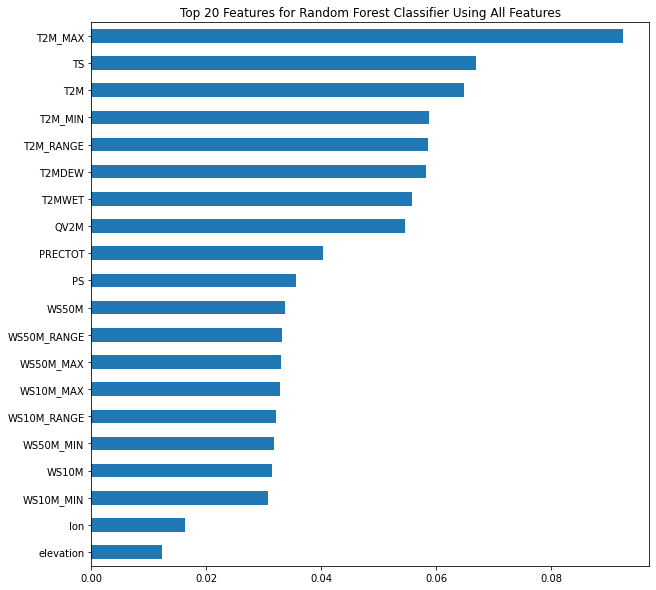

In [53]:
import matplotlib.pyplot as plt

importances = pd.Series(model.feature_importances_, X_train.columns)

n =20
plt.figure(figsize = (10, n/2))
plt.title(f'Top {n} Features for Random Forest Classifier Using All Features')
importances.sort_values()[-n:].plot.barh()

<AxesSubplot:title={'center':'Top 20 Features for Random Forest Classifier with MinMax Scaler Using All Features'}>

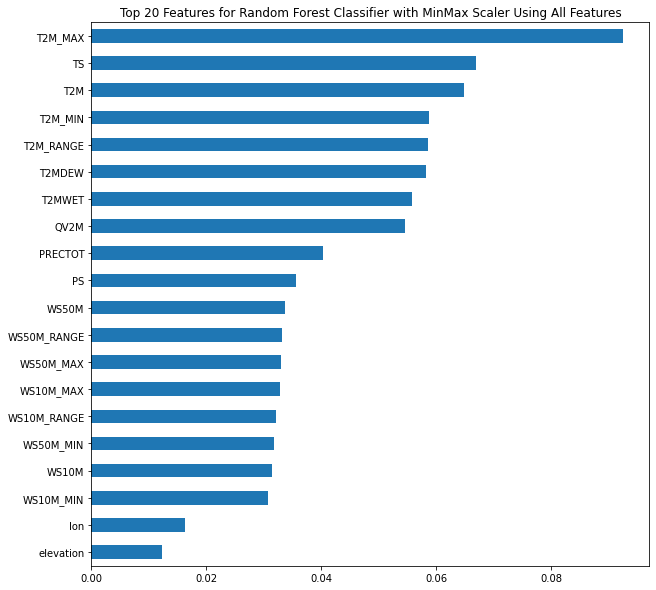

In [54]:
# Top 20 Features for Random Forest 15 trees & MinMaxScaler
rf_minmax = pipe_minmax.named_steps['randomforestclassifier']

importances_minmax = pd.Series(rf_minmax.feature_importances_, X_train.columns)

n =20
plt.figure(figsize = (10, n/2))
plt.title(f'Top {n} Features for Random Forest Classifier with MinMax Scaler Using All Features')
importances_minmax.sort_values()[-n:].plot.barh()

In [193]:
drought_cat(y_test)

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


0            none
1            none
2            none
3            none
4            none
5            none
6            none
7            none
8            none
9            none
10           none
11           none
12           none
13           none
14           none
15           none
16           none
17           none
18           none
19           none
20           none
21           none
22           none
23           none
24           none
25           none
26           none
27           none
28           none
29           none
30           none
31           none
32           none
33           none
34           none
35           none
36           none
37           none
38           none
39           none
40           none
41           none
42           none
43           none
44           none
45           none
46           none
47           none
48           none
49           none
50           none
51           none
52           none
53           none
54           none
55        

In [58]:
print('Test score is:', model.score(X_test, y_test))

Test score is: 0.745023174142965


In [59]:
print('Test score for Random Forest (15 Trees) & MinMax Scaler is:', pipe_minmax.score(X_test, y_test))

Test score for Random Forest (15 Trees) & MinMax Scaler is: 0.7451456806255998


# Permutation of Best Feature from Random Forest Model

In [60]:
perm_feature = 'T2M_MAX'
X_val[perm_feature].head(10)

date
2017-01-01    7.92
2017-01-02    3.24
2017-01-03    4.16
2017-01-04    8.41
2017-01-05   -1.55
2017-01-06   -2.75
2017-01-07   -5.34
2017-01-08   -7.32
2017-01-09   -4.95
2017-01-10    0.69
Name: T2M_MAX, dtype: float64

In [61]:
# Permute the valuation dataset with the T2M_MAX feature
X_val_permuted = X_val.copy()
X_val_permuted[perm_feature] = np.random.permutation(X_val[perm_feature])

In [62]:
X_val_permuted[perm_feature].head(10) # Verify permutation result

date
2017-01-01     2.99
2017-01-02    -2.69
2017-01-03    12.64
2017-01-04    10.96
2017-01-05    13.92
2017-01-06    15.73
2017-01-07    12.56
2017-01-08    13.39
2017-01-09    25.18
2017-01-10    12.23
Name: T2M_MAX, dtype: float64

In [63]:
# Calculate the score with the permutated feature to determine its true importance

score_permuted= model.score(X_val_permuted, y_val)

print(f'Validation Score with {perm_feature}:{model.score(X_val, y_val)}')
print(f'Validation Score with {perm_feature} permuted:{score_permuted}')
print(f'Importance of {perm_feature}:{(model.score(X_val, y_val)) - score_permuted}')

Validation Score with T2M_MAX:0.7709875281128603
Validation Score with T2M_MAX permuted:0.7727663054590064
Importance of T2M_MAX:-0.0017787773461460654


# Use eli5 Library to Review Permutation Importance

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance
# Set Permutation Importance from eli5 library

permuter = PermutationImportance(
    model,
    scoring = 'accuracy',
    n_iter = 5,
    random_state = 42
)

permuter.fit(X_val, y_val) # No need to transform X_val as it is already in correct state; fit permuter on the validation dataset

In [ ]:
feature_names = X_val.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values(ascending = False)

In [ ]:
# Display weights for all features

eli5.show_weights(
    permuter,
    top = None,
    feature_names = feature_names
)

In [ ]:
eli5.explain_weights(model, top = None, feature_names = feature_names)

# Set Up Drop Column to Determine Importance for T2M_MAX Feature

In [ ]:
# Drop column T2M_Max to determine its importance
feature_drop = 'T2M_MAX'

X_train_drop = X_train.drop(columns = feature_drop)
X_val_drop = X_val.drop(columns = feature_drop)

In [ ]:
# Set up Random Forest Classifier with Eliminated Feature

model_drop = RandomForestClassifier(
    n_jobs = -1, 
    max_depth = 15, 
    random_state = 42
)

model_drop.fit(X_train_drop, y_train)

print(f'Validation score with {feature_drop} is: {model.score(X_val, y_val)}')
print(f'Validation score without {feature_drop} is: {model_drop.score(X_val_drop, y_val)}')
print(f'The True Feature Importance of {feature_drop} is: {model.score(X_val, y_val) - model_drop.score(X_val_drop, y_val)}')

In [ ]:
# Set up Random Forest with 15 Trees, MinMax Scaler & 
# only 7 features with Positive Permutation Importances

features = ['T2MWET', 'T2MDEW', 'QV2M', 'PS', 
            'WS10M_RANGE', 'WS50M_MIN', 'WS10M_MAX']

X_train_7_pi = train_pa_final[features] # Create feature matrix for training dataset with 7 positive perm imp features
X_val_7_pi = val_pa_final[features] # Create feature matrix for validation dataset with 7 positive perm imp features
X_test_7_pi = test_pa_final[features] # Create feature matrix for training dataset with 7 positive perm imp features

pipe_minmax_7_pi = make_pipeline(
    MinMaxScaler(),
    RandomForestClassifier(n_jobs = -1, 
                           max_depth = 15,
                           random_state = 42)
)

pipe_minmax_7_pi.fit(X_train_7_pi, y_train)

print('Training score is:', pipe_minmax_7_pi.score(X_train_7_pi, y_train))
print('Validation score is:', pipe_minmax_7_pi.score(X_val_7_pi, y_val))


In [ ]:
X_train_7_pi.shape, X_val_7_pi.shape, X_test_7_pi.shape

In [ ]:
# Check Test Data with Random Forest with 15 Trees, MinMax Scaler & 
# only 7 features with Positive Permutation Importances

print('Test score for Random Forest(15 Trees), MinMax Scaler & \nonly 7 features with Positive Permutation Importances is:', pipe_minmax_7_pi.score(X_test_7_pi, y_test))

# Worse Test Score than with All Features

# Feature Selection using Sklearn

In [ ]:
# Feature Selection Using LinearSVC inside Pipeline
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel

pipe_minmax_lscv = make_pipeline(
    MinMaxScaler(),
    SelectFromModel(LinearSVC()),
    RandomForestClassifier(n_jobs = -1, 
                           max_depth = 15,
                           random_state = 42)
)

pipe_minmax_lscv.fit(X_train, y_train)

print('Training score is:', pipe_minmax_lscv.score(X_train, y_train))
print('Validation score is:', pipe_minmax_lscv.score(X_val, y_val))
print('Testing score is:', pipe_minmax_lscv.score(X_test, y_test))

# Use Undersampling with Random Forest

In [100]:
from imblearn.under_sampling import RandomUnderSampler
# Random Undersampling with Sampling Strategy

rus = RandomUnderSampler(sampling_strategy={'none' : 20000, 'abnormal' : 40000, 
                                            'moderate' : 20000, 'severe' : 4000,
                                            'extreme' : 1000, 'exceptional' : 5})

X_res, y_res = rus.fit_resample(X_train, y_train)

print(X_res.shape, y_res.shape)
print(pd.value_counts(y_res))

ModuleNotFoundError: No module named 'imblearn'

In [ ]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

pipe_robust = make_pipeline(
    RobustScaler(),
    RandomForestClassifier(n_jobs = -1, 
                           max_depth = 15,
                           random_state = 42)
)

pipe_robust.fit(X_res, y_res)

print('Training score is:', pipe_robust.score(X_res, y_res))
print('Validation score is:', pipe_robust.score(X_val, y_val))

In [ ]:
y_pred = pipe_robust.predict(X_test)
print('Test score for Undersample RF Model is:', accuracy_score(y_test, y_pred))

In [ ]:
# Random Undersampling with No Sampling Strategy

rus2 = RandomUnderSampler()

X_res2, y_res2 = rus2.fit_resample(X_train, y_train)

print(X_res2.shape, y_res2.shape)
print(pd.value_counts(y_res2))

In [ ]:
pipe_robust2 = make_pipeline(
    RobustScaler(),
    RandomForestClassifier(n_jobs = -1, 
                           max_depth = 15,
                           random_state = 42)
)

pipe_robust2.fit(X_res2, y_res2)

print('Training score is:', pipe_robust2.score(X_res2, y_res2))
print('Validation score is:', pipe_robust2.score(X_val, y_val))

In [ ]:
# Top 20 Features for Random Forest 15 trees, Robust Scaler & 30 observations
import matplotlib.pyplot as plt
rf_robust2 = pipe_robust2.named_steps['randomforestclassifier']

importances_robust2 = pd.Series(rf_robust2.feature_importances_, X_train.columns)

n =20
plt.figure(figsize = (10, n/2))
plt.title(f'Top {n} Features for Random Forest Classifier, Robust Scaler & 30 observations')
importances_robust2.sort_values()[-n:].plot.barh()

# Set Up XGBoost Model

In [123]:
import xgboost as xgb
from xgboost import XGBClassifier

In [90]:
params = {
    'max_depth': 15,
    'objective': 'multi:softmax',  # error evaluation for multiclass training
    'num_class': 5,
    'n_estimators': 300,
    'learning_rate': 1,
    'n_jobs': -1,
    'random_state': 42   
}

In [91]:
xgb_model = XGBClassifier(params)
xgb_model.fit(X_train, y_train)

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\core.py:427: FutureWarning: Pass `objective` as keyword args.  Passing these as positional arguments will be considered as error in future releases.
  warnings.warn(
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:25:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [92]:
print('Validation Accuracy for XGBoost Model is:', xgb_model.score(X_val, y_val))

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


Validation Accuracy for XGBoost Model is: 0.7622163156818647


In [93]:
print('Test Accuracy for XGBoost Model is:', xgb_model.score(X_test, y_test))

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


Test Accuracy for XGBoost Model is: 0.7442064642587337


In [68]:
# XGBoost Model No Early Stopping

xgb_model2 = XGBClassifier(
    n_estimators = 100,
    max_depth = 15,
    learning_rate = 1.0,
    n_jobs = -1,
    random_state = 42    
)

xgb_model2.fit(X_train, y_train)

print('Validation Accuracy for XGBoost Model (No Early Stopping) is:', xgb_model2.score(X_val, y_val))

Validation Accuracy for XGBoost Model (No Early Stopping) is: 0.708505418114905


In [69]:
print('Test Accuracy for XGBoost Model (No Early Stopping) is:', xgb_model2.score(X_test, y_test))

Test Accuracy for XGBoost Model (No Early Stopping) is: 0.7031055393347898


In [70]:
# XGBoost Model with No Early Stopping Overfit!!!

print('Training Accuracy for XGBoost Model (No Early Stopping) is:', xgb_model2.score(X_train, y_train))

Training Accuracy for SGBoost Model (No Early Stopping) is: 1.0


In [95]:
xgb_model3 = XGBClassifier(max_depth = 15,
    objective = 'multi:softmax',
    num_class = 5,
    n_estimators = 300,
    learning_rate = 1.0,
    n_jobs = -1,
    random_state = 42)

xgb_model3.fit(X_train, y_train)

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:38:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=1.0, max_delta_step=0, max_depth=15,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=300, n_jobs=-1, num_class=5, num_parallel_tree=1,
              objective='multi:softprob', random_state=42, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [96]:
print('Training Accuracy for XGBoost Model 3 is:', xgb_model3.score(X_train, y_train))
print('Validation Accuracy for XGBoost Model 3 is:', xgb_model3.score(X_val, y_val))
print('Test Accuracy for XGBoost Model 3 is:', xgb_model3.score(X_test, y_test))

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


Training Accuracy for XGBoost Model 3 is: 1.0


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


Validation Accuracy for XGBoost Model 3 is: 0.7133714986710284


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


Test Accuracy for XGBoost Model 3 is: 0.7056169222288012


# Use GridSearchCV to Optimize Hyperparameters for Random Forest Classifier

In [ ]:
# from sklearn.model_selection import GridSearchCV

# # Set up parameters distributions fro Grid Search as follows: 
# # (1) RandomForestClassifier for maximum number of features

# param_distributions = {
#     'max_features' : np.arange(1, len(X_train.columns)+1),
#     'max_depth' : [10, 15, 25, None], 
#     'n_estimators' : [75, 100, 300],
#     'criterion' : ['gini', 'entropy']
#  }

# # Set up a GridSearch

# search_grid = GridSearchCV(
#     model,
#     param_grid = param_distributions,
#     scoring = 'accuracy',
#     verbose = 10,
#     cv = 5,
#     n_jobs = -1,
#     refit = True,
#     return_train_score = True
# )

# search_grid.fit(X_train, y_train)

# Set Up Partial Dependence Plot

(<Figure size 1080x1620 with 7 Axes>,
 {'pdp_ax': [<matplotlib.axes._subplots.AxesSubplot at 0x7ff4ded78550>,
  'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7ff4dfabcd90>})

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


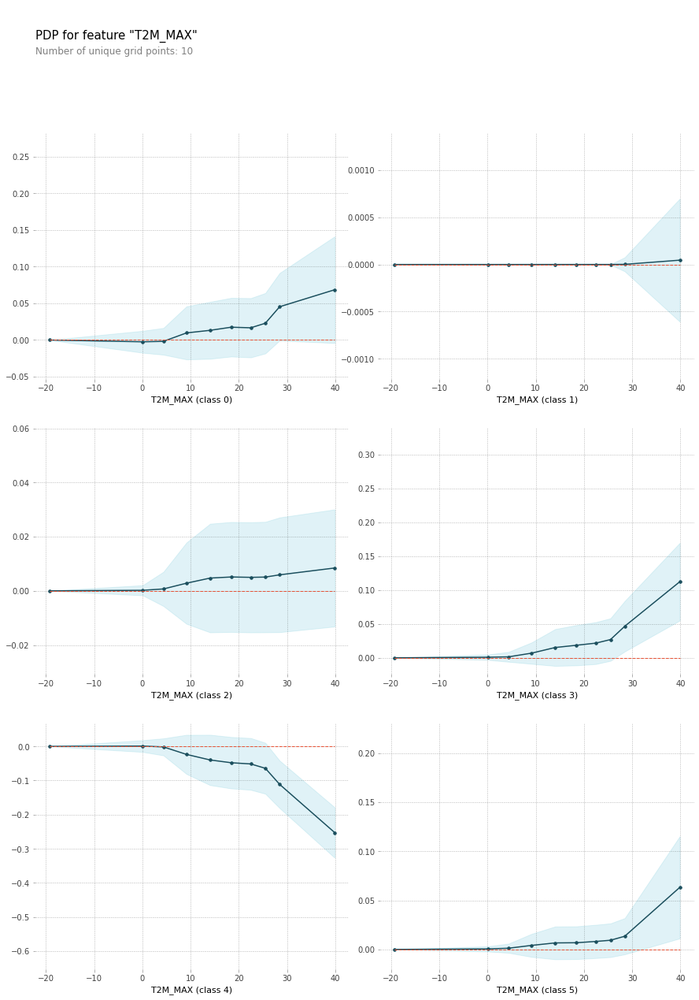

In [80]:
# Set Up Partial Dependence Plot with 'T2M_MAX' Feature

from pdpbox import pdp

feature_pdp = 'T2M_MAX'

pdp_dist = pdp.pdp_isolate(
    model = model,
    dataset = X_train,
    model_features = feature_names,
    feature = feature_pdp
)

pdp.pdp_plot(pdp_dist, feature_pdp)

(<Figure size 1080x1620 with 7 Axes>,
 {'pdp_ax': [<matplotlib.axes._subplots.AxesSubplot at 0x7ff4e143e510>,
  'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7ff4e14c2090>})

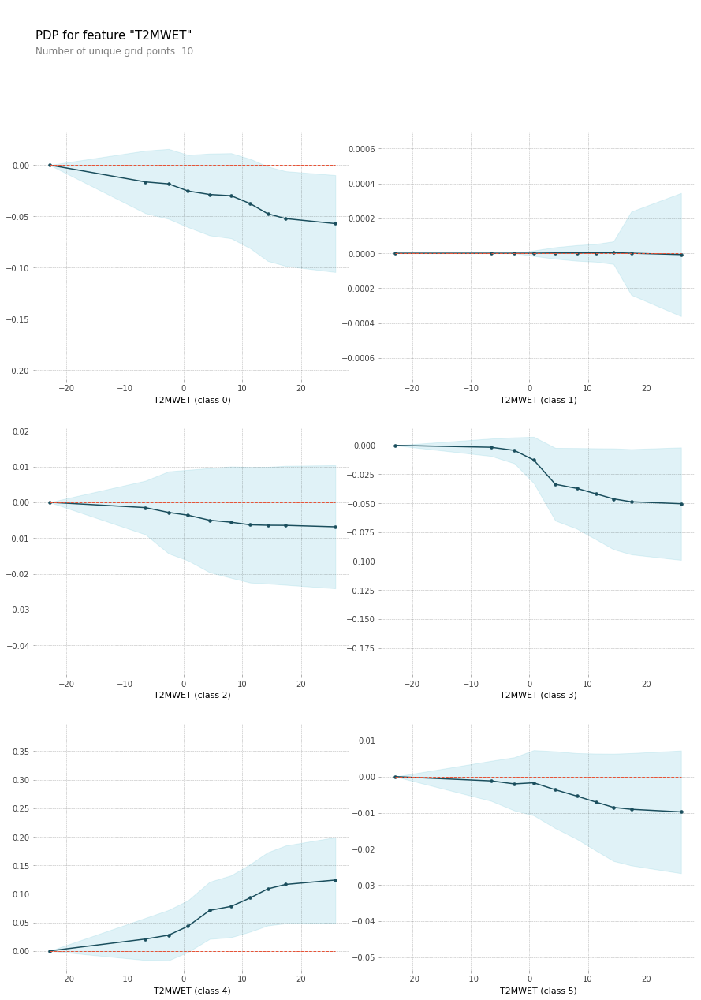

In [81]:
# Set Up Partial Dependence Plot with 'T2MWET' Feature
feature_pdp_2 = 'T2MWET'

pdp_dist_2 = pdp.pdp_isolate(
    model = model,
    dataset = X_train,
    model_features = feature_names,
    feature = feature_pdp_2
)

pdp.pdp_plot(pdp_dist_2, feature_pdp_2)

In [ ]:
# Set Up Partial Dependence Plot with 'T2M_MAX' and 'T2MWET' Features

features_pdp = ['T2M_MAX', 'T2MWET']

interaction = pdp.pdp_interact(
    model = model,
    dataset = X_train,
    model_features = feature_names,
    features = features_pdp
)

pdp.pdp_interact_plot(interaction, plot_type = 'grid', feature_names = features_pdp)

# Set Up Shapley Plot

In [85]:
pip install shap

     |████████████████████████████████| 358kB 6.9MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491629 sha256=834bca150b458f61551cd58b37c8ff18db928a2e4ede2b30e08ccd34ffdcb202
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap


In [86]:
y_test.tail(10)

date
2020-12-22    moderate
2020-12-23    abnormal
2020-12-24    abnormal
2020-12-25    abnormal
2020-12-26    abnormal
2020-12-27    abnormal
2020-12-28    abnormal
2020-12-29    abnormal
2020-12-30    abnormal
2020-12-31    abnormal
Name: score, dtype: object

In [89]:
test_pa_final.tail(10)

,fips,PRECTOT,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,T2M_RANGE,TS,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,score,lat,lon,elevation,slope1,slope2,slope3,slope4,slope5,slope6,slope7,slope8,aspectN,aspectE,aspectS,aspectW,aspectUnknown,WAT_LAND,NVG_LAND,URB_LAND,GRS_LAND,FOR_LAND,CULTRF_LAND,CULTIR_LAND,CULT_LAND,SQ1,SQ2,SQ3,SQ4,SQ5,SQ6,SQ7
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-12-22,42133,0.09,99.60,3.71,0.28,-0.47,-0.10,2.60,-2.08,4.68,-0.51,4.29,5.51,3.06,2.44,8.05,9.15,6.28,2.87,moderate,39.921839,-76.728446,206,0.0027,0.0332,0.1871,0.4141,0.2392,0.1215,0.0022,0.0,0.3034,0.1826,0.2245,0.2536,0.0359,0.0,0.0,3.7574,5.30829,48.591888,41.989292,0.353132,42.342422,3,2,1,1,1,1,1
2020-12-23,42133,0.00,100.72,3.49,-0.07,-1.16,-0.61,3.57,-3.68,7.26,-2.18,3.07,4.24,0.55,3.69,5.37,7.78,0.71,7.07,abnormal,39.921839,-76.728446,206,0.0027,0.0332,0.1871,0.4141,0.2392,0.1215,0.0022,0.0,0.3034,0.1826,0.2245,0.2536,0.0359,0.0,0.0,3.7574,5.30829,48.591888,41.989292,0.353132,42.342422,3,2,1,1,1,1,1
2020-12-24,42133,22.61,99.21,6.87,7.88,7.88,7.88,13.68,1.42,12.26,7.22,6.69,10.98,3.34,7.63,10.61,16.04,6.15,9.90,abnormal,39.921839,-76.728446,206,0.0027,0.0332,0.1871,0.4141,0.2392,0.1215,0.0022,0.0,0.3034,0.1826,0.2245,0.2536,0.0359,0.0,0.0,3.7574,5.30829,48.591888,41.989292,0.353132,42.342422,3,2,1,1,1,1,1
2020-12-25,42133,19.96,98.50,3.44,-0.35,-1.62,-0.99,14.18,-6.46,20.65,-0.22,6.57,8.95,5.38,3.57,8.94,13.38,7.27,6.11,abnormal,39.921839,-76.728446,206,0.0027,0.0332,0.1871,0.4141,0.2392,0.1215,0.0022,0.0,0.3034,0.1826,0.2245,0.2536,0.0359,0.0,0.0,3.7574,5.30829,48.591888,41.989292,0.353132,42.342422,3,2,1,1,1,1,1
2020-12-26,42133,0.03,99.70,1.98,-4.77,-8.67,-6.72,-2.08,-6.98,4.90,-4.54,4.71,6.00,2.38,3.61,6.72,8.20,3.91,4.29,abnormal,39.921839,-76.728446,206,0.0027,0.0332,0.1871,0.4141,0.2392,0.1215,0.0022,0.0,0.3034,0.1826,0.2245,0.2536,0.0359,0.0,0.0,3.7574,5.30829,48.591888,41.989292,0.353132,42.342422,3,2,1,1,1,1,1
2020-12-27,42133,0.00,100.52,2.53,-2.93,-5.44,-4.18,1.83,-7.48,9.31,-3.06,2.50,4.21,0.56,3.65,4.28,7.02,0.63,6.39,abnormal,39.921839,-76.728446,206,0.0027,0.0332,0.1871,0.4141,0.2392,0.1215,0.0022,0.0,0.3034,0.1826,0.2245,0.2536,0.0359,0.0,0.0,3.7574,5.30829,48.591888,41.989292,0.353132,42.342422,3,2,1,1,1,1,1
2020-12-28,42133,0.03,100.18,4.09,1.79,0.97,1.38,7.50,-1.35,8.85,1.27,3.98,4.69,2.63,2.06,6.79,8.24,5.00,3.23,abnormal,39.921839,-76.728446,206,0.0027,0.0332,0.1871,0.4141,0.2392,0.1215,0.0022,0.0,0.3034,0.1826,0.2245,0.2536,0.0359,0.0,0.0,3.7574,5.30829,48.591888,41.989292,0.353132,42.342422,3,2,1,1,1,1,1
2020-12-29,42133,0.00,101.19,2.73,-1.03,-4.36,-2.69,1.74,-3.20,4.95,-1.41,3.97,6.22,1.50,4.72,6.73,8.27,2.63,5.64,abnormal,39.921839,-76.728446,206,0.0027,0.0332,0.1871,0.4141,0.2392,0.1215,0.0022,0.0,0.3034,0.1826,0.2245,0.2536,0.0359,0.0,0.0,3.7574,5.30829,48.591888,41.989292,0.353132,42.342422,3,2,1,1,1,1,1
2020-12-30,42133,0.01,100.74,3.07,-0.25,-2.85,-1.55,2.85,-3.40,6.25,-0.60,4.48,7.03,1.90,5.13,7.18,10.87,3.75,7.12,abnormal,39.921839,-76.728446,206,0.0027,0.0332,0.1871,0.4141,0.2392,0.1215,0.0022,0.0,0.3034,0.1826,0.2245,0.2536,0.0359,0.0,0.0,3.7574,5.30829,48.591888,41.989292,0.353132,42.342422,3,2,1,1,1,1,1


In [222]:
# Isolate Observation No. 48976 (last observation) for Shapley plot
row = X_test.iloc[[48976]]

In [223]:
y_test.iloc[[48976]] # True classification for Observation No. 48976 (last observation)

date
2020-12-31    abnormal
Name: score, dtype: object

In [224]:
model.predict(row) # Predicted classification for Observation No. 48976 (last observation)

array(['none'], dtype=object)

***Model Predicted Observation No. 48976 (last observation) Incorrectly***

In [157]:
# List of the classes in the model and their order
# Due to lexicographical ordering of classes: 
# Class 0 = 'abnormal', Class 1 = ''exceptional', Class 2 = 'extreme', 
# Class 3 = 'moderate', Class 4 = 'none', and Class 5 = 'severe'

model.classes_

array(['abnormal', 'exceptional', 'extreme', 'moderate', 'none', 'severe'],
      dtype=object)

In [188]:
y_test.value_counts()

none        35828
abnormal     8350
moderate     4292
severe        507
Name: score, dtype: int64

In [238]:
import shap

explainer = shap.TreeExplainer(model) # Set Shapley Tree Explainer
shap_values = explainer.shap_values(row)

shap.initjs()

shap.force_plot(
    base_value = explainer.expected_value[4], # Must use value [4] because that is Class 4 = 'none' (the predicted value)
    shap_values = shap_values[4],
    features = row,
    link='logit'
)

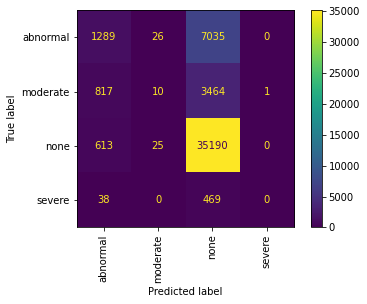

In [237]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(model, X_test, y_test, values_format = '.0f', 
                      xticks_rotation = 'vertical', 
                      labels = ['abnormal', 'moderate', 'none', 'severe'])

In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_test)

In [235]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

    abnormal       0.47      0.15      0.23      8350
    moderate       0.16      0.00      0.00      4292
        none       0.76      0.98      0.86     35828
      severe       0.00      0.00      0.00       507

    accuracy                           0.75     48977
   macro avg       0.35      0.28      0.27     48977
weighted avg       0.65      0.75      0.67     48977



# Create Subset of Dataframe to Better Hypertune Parameters

In [65]:
y_train.value_counts(normalize = True)

none           0.679189
abnormal       0.252265
moderate       0.054366
severe         0.010392
extreme        0.003776
exceptional    0.000012
Name: score, dtype: float64

In [94]:
train_sm = train_pa_final.sample(n = 100000)
train_sm.shape

(100000, 51)

In [95]:
train_sm['score'].value_counts(normalize = True)

none        0.67920
abnormal    0.25316
moderate    0.05413
severe      0.00977
extreme     0.00374
Name: score, dtype: float64

In [96]:
train_sm.index

DatetimeIndex(['2007-03-18', '2013-01-06', '2007-07-27', '2010-12-16',
               '2011-06-28', '2005-04-09', '2008-12-08', '2002-05-10',
               '2004-04-10', '2001-07-25',
               ...
               '2012-05-29', '2007-09-11', '2009-08-10', '2000-03-02',
               '2000-08-01', '2011-03-12', '2004-07-22', '2010-03-05',
               '2015-07-22', '2001-01-30'],
              dtype='datetime64[ns]', name='date', length=100000, freq=None)

In [97]:
X_train_sm = train_sm.drop(target, axis = 1)

In [99]:
y_train_sm = train_sm[target]

date
2007-03-18        none
2013-01-06        none
2007-07-27    moderate
2010-12-16        none
2011-06-28        none
                ...   
2011-03-12        none
2004-07-22        none
2010-03-05        none
2015-07-22        none
2001-01-30    abnormal
Name: score, Length: 100000, dtype: object

In [132]:
# Set up Random Forest Classifier with 15 trees & RobustScaler
# from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
# from sklearn.pipeline import make_pipeline

pipe_robust_sm = make_pipeline(
    RobustScaler(),
    RandomForestClassifier(n_jobs = -1, 
                           max_depth = 12,
                           random_state = 42,
                          n_estimators = 300, 
                           min_samples_split = 10,
                          bootstrap = True)
)

pipe_robust_sm.fit(X_train_sm, y_train_sm)

print('Training score for Small Training Set is:', pipe_robust_sm.score(X_train_sm, y_train_sm))
print('Validation score is:', pipe_robust_sm.score(X_val, y_val))
print('Testing score is:', pipe_robust_sm.score(X_test, y_test))


Training score for Small Training Set is: 0.7167
Validation score is: 0.7741770599059496
Testing score is: 0.7454519468321865


In [135]:
pipe_xgb_sm = make_pipeline(
    RobustScaler(),
    XGBClassifier(max_depth = 3,
                  objective = 'multi:softmax',
                  num_class = 5,
                  n_estimators = 100,
                  learning_rate = 0.4,
                  n_jobs = -1,
                  random_state = 42)
)

pipe_xgb_sm.fit(X_train_sm, y_train_sm)

print('XGB Training score for Small Training Set is:', pipe_xgb_sm.score(X_train_sm, y_train_sm))
print('XGB Validation score is:', pipe_xgb_sm.score(X_val, y_val))
print('XGB Testing score is:', pipe_xgb_sm.score(X_test, y_test))

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:22:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


XGB Training score for Small Training Set is: 0.70273
XGB Validation score is: 0.7710897566959722


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


XGB Testing score is: 0.7454723645792923


In [149]:
# SelectKBest for Smaller Dataset (100,000 Random Sample)

for k in range(1, len(X_train.columns)+1):
    print(f'{k} features')
    
    selector = SelectKBest(score_func=f_classif, k=k)
    X_train_selected = selector.fit_transform(X_train_sm, y_train_sm)
    X_val_selected = selector.transform(X_val)
    X_test_selected = selector.transform(X_test)

    model = make_pipeline(
        RobustScaler(),
        RandomForestClassifier(n_jobs = -1, 
                           max_depth = 12,
                           random_state = 42,
                          n_estimators = 300, 
                           min_samples_split = 10,
                          bootstrap = True)
)
    
    model.fit(X_train_selected, y_train_sm)
    
    y_pred_val = model.predict(X_val_selected)
    acc_val = accuracy_score(y_val, y_pred_val)
    
#    y_pred_test = model.predict(X_test_selected)
    acc_test = model.score(X_test_selected, y_test)
    
    print(f'Validation Score is: {acc_val} \n')
    print(f'Test Score is: {acc_test} \n')

# Highest Validation/Test Score is for 29 Features

1 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7640768758945001 

Test Score is: 0.731955815995263 

2 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7673481905540789 

Test Score is: 0.7366518978295935 

3 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7682886935187079 

Test Score is: 0.7364681381056414 

4 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7678184420363934 

Test Score is: 0.7368152398064397 

5 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7666121447556737 

Test Score is: 0.7368764930477572 

6 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7677162134532816 

Test Score is: 0.7400004083549421 

7 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7679820077693723 

Test Score is: 0.7408171182391735 

8 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7683500306685749 

Test Score is: 0.7398370663780959 

9 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7675935391535473 

Test Score is: 0.7401229148375769 

10 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7676753220200369 

Test Score is: 0.7401433325846826 

11 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7684727049683091 

Test Score is: 0.7402454213202115 

12 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7688816193007565 

Test Score is: 0.7405516875267983 

13 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7689020650173789 

Test Score is: 0.7405312697796925 

14 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7729298711919853 

Test Score is: 0.7452069338669172 

15 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7732774483745656 

Test Score is: 0.7454519468321865 

16 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7728480883254958 

Test Score is: 0.74645241644037 

17 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7730934369249642 

Test Score is: 0.7466157584172163 

18 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7731547740748314 

Test Score is: 0.746268656716418 

19 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7728480883254958 

Test Score is: 0.7459419727627253 

20 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7735227969740339 

Test Score is: 0.7466770116585336 

21 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7734819055407892 

Test Score is: 0.7460032260040427 

22 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7734410141075445 

Test Score is: 0.7460848969924658 

23 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7736454712737681 

Test Score is: 0.7467995181411683 

24 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7735023512574116 

Test Score is: 0.7471262020948608 

25 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7733183398078103 

Test Score is: 0.7475753925311881 

26 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7732978940911879 

Test Score is: 0.7474937215427649 

27 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7731956655080761 

Test Score is: 0.7474528860485534 

28 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7732365569413208 

Test Score is: 0.7467995181411683 

29 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.77374769985688 

Test Score is: 0.7476366457725054 

30 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7738499284399918 

Test Score is: 0.7464319986932642 

31 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7734614598241668 

Test Score is: 0.7465545051758989 

32 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7736045798405234 

Test Score is: 0.7461257324866775 

33 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7736863627070129 

Test Score is: 0.7460032260040427 

34 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7737272541402577 

Test Score is: 0.74645241644037 

35 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7738294827233695 

Test Score is: 0.7459623905098312 

36 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7731138826415865 

Test Score is: 0.7466565939114278 

37 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7731343283582089 

Test Score is: 0.7464728341874758 

38 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7738294827233695 

Test Score is: 0.7458603017743022 

39 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7734819055407892 

Test Score is: 0.7459419727627253 

40 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7737272541402577 

Test Score is: 0.7459623905098312 

41 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7738499284399918 

Test Score is: 0.7463094922106295 

42 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7739317113064813 

Test Score is: 0.745880719521408 

43 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7739521570231037 

Test Score is: 0.7447577434305899 

44 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7742588427724392 

Test Score is: 0.745309022602446 

45 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7740543856062155 

Test Score is: 0.744737325683484 

46 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7739521570231037 

Test Score is: 0.7453702758437634 

47 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7739930484563484 

Test Score is: 0.7453906935908692 

48 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7741566141893274 

Test Score is: 0.7453498580966577 

49 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7740543856062155 

Test Score is: 0.7457582130387733 

50 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7741770599059496 

Test Score is: 0.7454519468321865 



In [150]:
from sklearn.feature_selection import SelectKBest, f_classif

selector = SelectKBest(score_func = f_classif, k = 29)

X_train_selected = selector.fit_transform(X_train_sm, y_train_sm)

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


In [151]:
selected_mask = selector.get_support()
all_names = X_train.columns

selected_names = all_names[selected_mask]
unselected_names = all_names[~selected_mask]

print('Feature Selected:')
for name in selected_names:
    print(name)

print('\n')


print('Feature Not Selected:')
for name in unselected_names:
    print(name)

print('\n')

Feature Selected:
PS
QV2M
T2M
T2MDEW
T2MWET
T2M_MAX
T2M_MIN
T2M_RANGE
TS
WS10M
WS10M_MAX
WS10M_MIN
WS10M_RANGE
WS50M
WS50M_MAX
lat
lon
elevation
slope1
slope2
slope3
slope5
slope6
aspectW
aspectUnknown
URB_LAND
GRS_LAND
FOR_LAND
CULTIR_LAND


Feature Not Selected:
fips
PRECTOT
WS50M_MIN
WS50M_RANGE
slope4
slope7
slope8
aspectN
aspectE
aspectS
WAT_LAND
NVG_LAND
CULTRF_LAND
CULT_LAND
SQ1
SQ2
SQ3
SQ4
SQ5
SQ6
SQ7




In [186]:
# SelectKBest for Full Dataset
df = pd.DataFrame(columns = ['No. Features', 'Val Score', 'Test Score'])

for k in range(1, len(X_train.columns)+1):
    print(f'{k} features')
    
    selector = SelectKBest(score_func=f_classif, k=k)
    X_train_selected = selector.fit_transform(X_train, y_train)
    X_val_selected = selector.transform(X_val)
    X_test_selected = selector.transform(X_test)

    model = make_pipeline(
        RobustScaler(),
        RandomForestClassifier(n_jobs = -1, 
                           max_depth = 12,
                           random_state = 42,
                          n_estimators = 300, 
                           min_samples_split = 10,
                          bootstrap = True)
)
    
    model.fit(X_train_selected, y_train)
    
    y_pred_val = model.predict(X_val_selected)
    acc_val = accuracy_score(y_val, y_pred_val)
    
#    y_pred_test = model.predict(X_test_selected)
    acc_test = model.score(X_test_selected, y_test)
    
    print(f'Validation Score is: {acc_val} \n')
    print(f'Test Score is: {acc_test} \n')
    
    df = df.append({'No. Features' : k, 'Val Score' : acc_val, 'Test Score' : acc_test},  ignore_index = True)

1 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7648333674095277 

Test Score is: 0.7342834391653225 

2 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7683704763851973 

Test Score is: 0.7373461012311902 

3 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.771130648129217 

Test Score is: 0.7392449517120281 

4 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7688202821508894 

Test Score is: 0.7378565449088348 

5 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7681660192189737 

Test Score is: 0.7375911141964595 

6 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7682478020854631 

Test Score is: 0.7408375359862793 

7 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7698016765487631 

Test Score is: 0.741143802192866 

8 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7701901451645881 

Test Score is: 0.741143802192866 

9 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7691883050500921 

Test Score is: 0.7411846376870777 

10 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7698630136986301 

Test Score is: 0.7413479796639239 

11 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7697198936822736 

Test Score is: 0.7410825489515487 

12 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7702719280310775 

Test Score is: 0.7414092329052412 

13 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7699447965651196 

Test Score is: 0.7414909038936643 

14 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7739521570231037 

Test Score is: 0.7452886048553402 

15 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7742997342056839 

Test Score is: 0.745023174142965 

16 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7736454712737681 

Test Score is: 0.745696959797456 

17 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7738090370067471 

Test Score is: 0.7457990485329848 

18 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7738294827233695 

Test Score is: 0.7457786307858791 

19 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7737068084236353 

Test Score is: 0.7454927823263982 

20 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7741770599059496 

Test Score is: 0.7454315290850807 

21 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7738908198732366 

Test Score is: 0.7449210854074362 

22 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7739521570231037 

Test Score is: 0.7452477693611287 

23 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7744837456552852 

Test Score is: 0.7450844273842824 

24 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.774585974238397 

Test Score is: 0.745309022602446 

25 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.774361071355551 

Test Score is: 0.7469424423709088 

26 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7734001226742997 

Test Score is: 0.746166567980889 

27 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7743815170721734 

Test Score is: 0.7466157584172163 

28 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7742588427724392 

Test Score is: 0.7463911631990526 

29 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7744837456552852 

Test Score is: 0.74606447924536 

30 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.774585974238397 

Test Score is: 0.7467791003940625 

31 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7740339398895931 

Test Score is: 0.7460236437511485 

32 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7744428542220405 

Test Score is: 0.7459419727627253 

33 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7739521570231037 

Test Score is: 0.7462074034751005 

34 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7744632999386628 

Test Score is: 0.7462074034751005 

35 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7741770599059496 

Test Score is: 0.7458398840271965 

36 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7740134941729707 

Test Score is: 0.7463707454519468 

37 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7745246370885299 

Test Score is: 0.7467586826469568 

38 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7745041913719076 

Test Score is: 0.7462074034751005 

39 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7744019627887957 

Test Score is: 0.7462482389693121 

40 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7741770599059496 

Test Score is: 0.7462482389693121 

41 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7740952770394602 

Test Score is: 0.7454723645792923 

42 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7741157227560826 

Test Score is: 0.7455744533148212 

43 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7737272541402577 

Test Score is: 0.7452477693611287 

44 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7744632999386628 

Test Score is: 0.7455336178206097 

45 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7742997342056839 

Test Score is: 0.745411111337975 

46 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.774585974238397 

Test Score is: 0.7455744533148212 

47 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7741975056225721 

Test Score is: 0.7452477693611287 

48 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7747904314046208 

Test Score is: 0.7451660983727055 

49 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7741975056225721 

Test Score is: 0.745125262878494 

50 features


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Validation Score is: 0.7741975056225721 

Test Score is: 0.7452477693611287 



In [ ]:
df

In [192]:
df['Test Score'].sort_values(ascending = False)

24    0.746942
29    0.746779
36    0.746759
26    0.746616
27    0.746391
35    0.746371
39    0.746248
38    0.746248
37    0.746207
32    0.746207
33    0.746207
25    0.746167
28    0.746064
30    0.746024
31    0.745942
34    0.745840
16    0.745799
17    0.745779
15    0.745697
41    0.745574
45    0.745574
43    0.745534
18    0.745493
40    0.745472
19    0.745432
44    0.745411
23    0.745309
13    0.745289
46    0.745248
42    0.745248
49    0.745248
21    0.745248
47    0.745166
48    0.745125
22    0.745084
14    0.745023
20    0.744921
12    0.741491
11    0.741409
9     0.741348
8     0.741185
7     0.741144
6     0.741144
10    0.741083
5     0.740838
2     0.739245
3     0.737857
4     0.737591
1     0.737346
0     0.734283
Name: Test Score, dtype: float64

In [193]:
df['Val Score'].sort_values(ascending = False)

47    0.774790
29    0.774586
23    0.774586
45    0.774586
36    0.774525
37    0.774504
22    0.774484
28    0.774484
33    0.774463
43    0.774463
31    0.774443
38    0.774402
26    0.774382
24    0.774361
44    0.774300
14    0.774300
27    0.774259
49    0.774198
48    0.774198
46    0.774198
34    0.774177
19    0.774177
39    0.774177
41    0.774116
40    0.774095
30    0.774034
35    0.774013
21    0.773952
32    0.773952
13    0.773952
20    0.773891
17    0.773829
16    0.773809
42    0.773727
18    0.773707
15    0.773645
25    0.773400
2     0.771131
11    0.770272
7     0.770190
12    0.769945
9     0.769863
6     0.769802
10    0.769720
8     0.769188
3     0.768820
1     0.768370
5     0.768248
4     0.768166
0     0.764833
Name: Val Score, dtype: float64

In [194]:
# Pick the top 29 features based on For Loop on Full Dataset

selector = SelectKBest(score_func = f_classif, k = 29)

X_train_selected = selector.fit_transform(X_train, y_train)

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:114: UserWarning: Features [36 45 47 48 49] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx,
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


In [195]:
# Check which 29 features were selected from Full Dataset

selected_mask = selector.get_support()
all_names = X_train.columns

selected_names = all_names[selected_mask]
unselected_names = all_names[~selected_mask]

print('Feature Selected:')
for name in selected_names:
    print(name)

print('\n')


print('Feature Not Selected:')
for name in unselected_names:
    print(name)

print('\n')

Feature Selected:
PS
QV2M
T2M
T2MDEW
T2MWET
T2M_MAX
T2M_MIN
T2M_RANGE
TS
WS10M
WS10M_MAX
WS10M_MIN
WS10M_RANGE
WS50M
WS50M_MAX
lat
lon
elevation
slope1
slope2
slope3
slope5
slope6
aspectW
aspectUnknown
URB_LAND
GRS_LAND
FOR_LAND
CULTIR_LAND


Feature Not Selected:
fips
PRECTOT
WS50M_MIN
WS50M_RANGE
slope4
slope7
slope8
aspectN
aspectE
aspectS
WAT_LAND
NVG_LAND
CULTRF_LAND
CULT_LAND
SQ1
SQ2
SQ3
SQ4
SQ5
SQ6
SQ7




In [194]:
# Build New Random Forest Model with 29 Best Features from SelectKBest + Eng Features
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

features_29 = ['PS', 'QV2M', 'T2M', 'T2MDEW', 'T2MWET',
               'T2M_MAX', 'T2M_MIN', 'T2M_RANGE', 'TS', 
               'WS10M', 'WS10M_MAX', 'WS10M_MIN', 
               'WS10M_RANGE','WS50M', 'WS50M_MAX', 'lat',
               'lon', 'elevation', 'slope1', 'slope2', 
               'slope3', 'slope5', 'slope6', 'aspectW', 
               'aspectUnknown', 'URB_LAND', 'GRS_LAND',
               'FOR_LAND', 'CULTIR_LAND', 'weekly_prec',
               'biweekly_prec', 'triweekly_prec', 'monthly_prec']

X_train_29 = train_pa_final[features_29]
X_val_29 = val_pa_final[features_29]
X_test_29 = test_pa_final[features_29]

model_29 = make_pipeline(
        RobustScaler(),
        RandomForestClassifier(n_jobs = -1, 
                           max_depth = 12,
                           random_state = 42,
                          n_estimators = 300, 
                           min_samples_split = 10,
                          bootstrap = True)
)
    
model_29.fit(X_train_29, y_train)

acc_train_29 = model_29.score(X_train_29, y_train)
acc_val_29 = model_29.score(X_val_29, y_val)
acc_test_29 = model_29.score(X_test_29, y_test)

print(f'Training Score for Model with 29 Best Features is: {acc_train_29} \n')
print(f'Validation Score for Model with 29 Best Features is: {acc_val_29} \n')
print(f'Test Score for Model with 29 Best Features is: {acc_test_29} \n')

Training Score for Model with 29 Best Features is: 0.7404210829908429 

Validation Score for Model with 29 Best Features is: 0.7719280310774893 

Test Score for Model with 29 Best Features is: 0.7769156951222003 



<AxesSubplot:title={'center':'Top 33 Features for Random Forest Classifier with MinMax Scaler Using All Features'}>

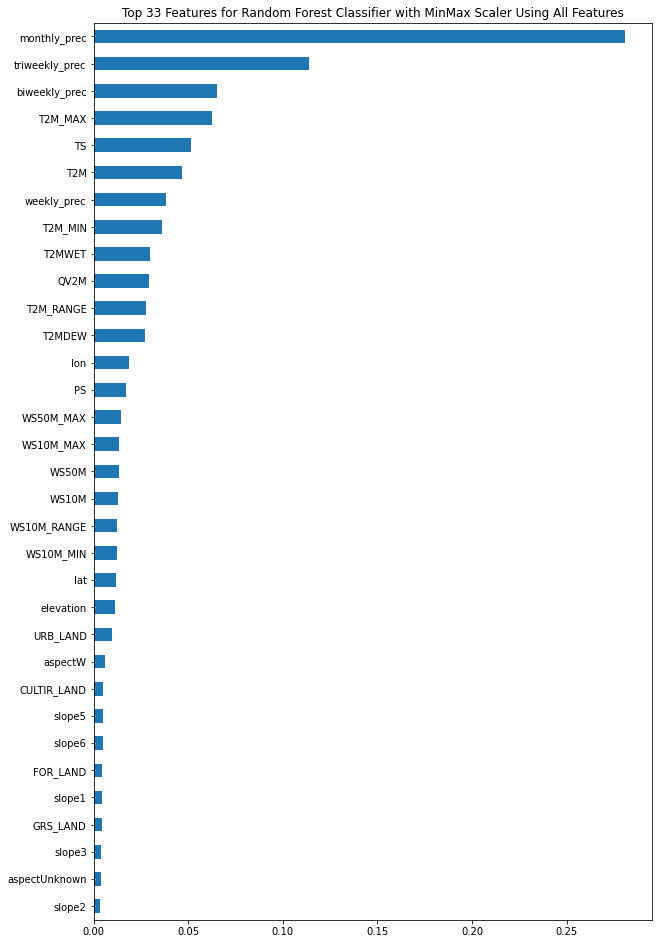

In [198]:
# Fix Wording
import matplotlib.pyplot as plt

rf_minmax = model_29.named_steps['randomforestclassifier']

importances_minmax = pd.Series(rf_minmax.feature_importances_, X_train_29.columns)

n =33
plt.figure(figsize = (10, n/2))
plt.title(f'Top {n} Features for Random Forest Classifier with MinMax Scaler Using All Features')
importances_minmax.sort_values()[-n:].plot.barh()

In [196]:
# Build New XGB Model with 29 Best Features from SelectKBest + Eng Features
from xgboost import XGBClassifier

pipe_xgb_29 = make_pipeline(
    RobustScaler(),
    XGBClassifier(max_depth = 3,
                  objective = 'multi:softmax',
                  num_class = 5,
                  n_estimators = 100,
                  learning_rate = 0.4,
                  n_jobs = -1,
                  random_state = 42)
)

pipe_xgb_29.fit(X_train_29, y_train)

print('XGB Training Score for 29 Best Features is:', pipe_xgb_29.score(X_train_29, y_train))
print('XGB Validation Score for 29 Best Features is:', pipe_xgb_29.score(X_val_29, y_val))
print('XGB Testing Score for 29 Best Features is:', pipe_xgb_29.score(X_test_29, y_test))

c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:46:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


XGB Training Score for 29 Best Features is: 0.7260869565217392
XGB Validation Score for 29 Best Features is: 0.766632590472296


c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(
c:\users\iamwe\.virtualenvs\github-h_xesqbw\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


XGB Testing Score for 29 Best Features is: 0.7662780488800865


In [202]:
X_train_29.head()

,PS,QV2M,T2M,T2MDEW,T2MWET,T2M_MAX,T2M_MIN,T2M_RANGE,TS,WS10M,...,slope2,slope3,slope5,slope6,aspectW,aspectUnknown,URB_LAND,GRS_LAND,FOR_LAND,CULTIR_LAND
date,,,,,,,,,,,,,,,,,,,,,
2000-01-01,99.76,4.06,1.22,0.73,0.73,7.14,-2.04,9.18,0.61,2.14,...,0.2971,0.4955,0.023,0.0078,0.2254,0.3173,0.9597,4.079156,33.219521,0.38361
2000-01-02,99.41,5.71,5.02,5.27,5.27,9.35,1.20,8.16,4.56,3.42,...,0.2971,0.4955,0.023,0.0078,0.2254,0.3173,0.9597,4.079156,33.219521,0.38361
2000-01-03,99.20,7.49,9.46,9.44,9.44,13.50,6.32,7.18,8.88,3.11,...,0.2971,0.4955,0.023,0.0078,0.2254,0.3173,0.9597,4.079156,33.219521,0.38361
2000-01-04,98.29,7.68,10.13,9.17,9.18,14.81,1.72,13.09,9.54,5.51,...,0.2971,0.4955,0.023,0.0078,0.2254,0.3173,0.9597,4.079156,33.219521,0.38361
2000-01-05,99.78,2.67,-0.32,-4.76,-4.69,3.43,-3.22,6.64,-0.86,4.52,...,0.2971,0.4955,0.023,0.0078,0.2254,0.3173,0.9597,4.079156,33.219521,0.38361


In [23]:
# Set Up Partial Dependence Plot with 'PRECTOT' Feature

from pdpbox import pdp

feature_pdp = 'PRECTOT'

pdp_dist = pdp.pdp_isolate(
    model = model,
    dataset = X_train,
    model_features = feature_names,
    feature = feature_pdp
)

pdp.pdp_plot(pdp_dist, feature_pdp)

ModuleNotFoundError: No module named 'pdpbox'